# The shunPykeR's guide to single cell analysis

For a full description and infographic of the shunPykeR pipeline, please check the Github repository main page (https://github.com/kousaa/shunPykeR).

<a id='contents'></a>

## Table of contents 

**0 Notebook setup <a href='#setup'>🕹️</a>**
  
**1 Perform quality control and clean-up samples <a href='#QC'>🕹️</a>**

 * 1.1 Load cellranger files
 * 1.2 Calculate quality control metrics and perform standard clean-up
     * 1.2.1 Identify doublets
     * 1.2.2 Remove not expressed genes
     * 1.2.3 Remove ribosomal and hemoglobin genes
     * 1.2.4 Normalize each cell's library size
     * 1.2.5 Log-transform counts
 * 1.3 Select a subset of principal components
 * 1.4 Run unsupervised clustering analysis with leiden
 * 1.5 Filter out bad quality cells and other cell contaminants by cluster
 * 1.6 Filter out doublets
 * 1.7 Inspect the data after removal of "unwanted" cells
 * 1.8 Reanalyze the data after removal of "unwanted" cells

**2 Regress out cell cycle (optional) <a href='#phase'>🕹️</a>**
 * 2.1 Compute cell cycle phase
 * 2.2 Regress cell cycle effect out and reanalyze the data
 
**3 Correct for batch effects with harmony (optional) <a href='#harmony'>🕹️</a>**
 * 3.1 hvgs without batch effect correction
 * 3.2 hvgs with batch effect correction
 * 3.3 Rerun leiden clustering after harmony correction
    
**4 Inspect basic data visualization <a href='#basicgraphs'>🕹️</a>**
 * 4.1 Create group annotation
 * 4.2 Explore visualization plots
 * 4.2.1 Dotplot
 * 4.2.2 Stacked violin plot
 * 4.2.3 Heatmap
 * 4.2.4 Stacked barplots
 * 4.2.5 Delta difference barplots

**5 Denoise and impute genes with magic (optional) <a href='#magic'>🕹️</a>**
 * 5.1 Visualize magic imputed data in a scatterplot
 * 5.2 Visualize magic imputed data in a sorted heatmap
    
**6 Apply differential expression analysis (DEA) <a href='#DEA'>🕹️</a>**
 * 6.1 Wilcoxon test
 * 6.2 Visualize the DEA results
 * 6.3 From DEA to pathway and network enrichment analysis**
     * 6.3.1 Convert DEA results to gsea ranks
     * 6.3.2 GSEA
     * 6.3.3 Run enrichmentMap in Cytoscape
     * 6.3.4 Plot cytoscape networks as a summarised dotplot
 
**7 Integration with other types of scOMICs data <a href='#scOMICs'>🕹️</a>**
 * 7.1 RNA velocity with loom data
 * 7.2 Spatial localization with visium data
 * 7.3 Cross-species integration with mousipy

**System log <a href='#systemlog'>🕹️</a>**

<a id='setup'></a>

## 0 Notebook setup

Load python packages and modules that are used across this notebook. For an introduction to python packages and modules, please see https://realpython.com/python-modules-packages/#python-packages.    

In [1]:
import scanpy as sc
import scanpy.external as sce
import scvelo as scv
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
from pathlib import Path
from sklearn.metrics.pairwise import cosine_distances
from mousipy import translate

import matplotlib.font_manager
import openpyxl
import pyreadr
import rpy2
#from rpy2.robjects.packages import importr
#import rpy2.robjects as robjects
#import seaborn as sns
import palantir
import loompy
import feather
import re
#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)
import matplotlib.lines as lines

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scv.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True, format='pdf')

pd.set_option('display.max_rows', 200)

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.2 scipy==1.5.3 pandas==1.3.5 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [2]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [3]:
%load_ext rpy2.ipython

%R if (!require("pacman")) install.packages("pacman")
%R pacman::p_load(MAST, scales, data.table, openxlsx, ggplot2, ggpubr, RColorBrewer, dichromat, readxl, ggpubr, pheatmap, dplyr, arrow, feather, DelayedArray, HDF5Array, stringr, parallel)

Unable to determine R library path: Command '('/Library/Frameworks/R.framework/Resources/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 1.
Error in file(filename, "r", encoding = encoding) : 
  cannot open the connection
In addition: Warning message:
In file(filename, "r", encoding = encoding) :
  cannot open file 'renv/activate.R': No such file or directory
R[write to console]: Loading required package: pacman



1,1,1,...,1,1,1


`%matplotlib inline` is a magic command that renders the figures within the notebook. For more information regarding python's magic operators, see https://ipython.readthedocs.io/en/stable/interactive/magics.html.

In [4]:
%matplotlib inline 

To get you started in a visually pleasing way, here are some manually curated color palettes. Feel free to use the ones provided here, the python predefined ones here (https://matplotlib.org/stable/tutorials/colors/colormaps.html) or make up your own.

In [5]:
# divergent
user_defined_palette =  [ '#3283FE', '#16FF32', '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
# gradient of one color
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
# gradient of two colors
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

💡 **Hint:** Use the code below ONLY if you need to install extra packages

In [6]:
#import sys
#!{sys.executable} -m pip install openpyxl

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='QC'></a>

## 1 Perform quality control and clean-up samples

### 1.1 Load cellranger files

Start by converting any cellranger's (https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/output/overview) Hierarchical Data Format 5 (H5 or h5) files into a scRNA-seq friendly python object called an anndata object. This object can store different types of information under its multiple compartments. For a more detailed explanation, see https://anndata.readthedocs.io/en/latest/anndata.AnnData.html#anndata.AnnData. 

The example below uses Peripheral Blood Mononuclear Cells (PBMCs) datasets from the 10x Genomics public repository, processed with cellranger v2 [⬇️](https://cf.10xgenomics.com/samples/cell-exp/3.0.0/pbmc_1k_v2/pbmc_1k_v2_filtered_feature_bc_matrix.h5) and v3 [⬇️](https://cf.10xgenomics.com/samples/cell-exp/3.0.0/pbmc_1k_v3/pbmc_1k_v3_filtered_feature_bc_matrix.h5) to perform a mock analysis).

✍️ Provide the path to your cellranger's `filtered_feature_bc.h5` files in the `tenexdir` row below. The code will search that directory and store all h5 files in a python [list](https://realpython.com/python-lists-tuples/), names here `adatas_list` as it contains multiple adata (short for anndata) objects.

In [7]:
adatas_list=[]

tenexdir = '../data/10xGenomics/'
h5_path = Path(tenexdir).glob('*.h5')

# a for loop to read and store all .h5 files under the tenexdir path
for path in h5_path:
    tmp_adata = sc.read_10x_h5(path)
    tmp_adata.var_names_make_unique()
    print(tmp_adata.shape) # check the number of cells and genes in each sample
    adatas_list.append(tmp_adata)

reading ../data/10xGenomics/pbmc_1k_v2_filtered_feature_bc_matrix.h5
 (0:00:00)
(996, 33538)
reading ../data/10xGenomics/pbmc_1k_v3_filtered_feature_bc_matrix.h5
 (0:00:00)
(1222, 33538)


✍️ The next command will take as input the various anndata objects that have been created above, concatenate them and create a metadata field using the `label` field. Use then the `keys` field to annotate each sample accordingly. The order of the samples is defined by the order that the h5 files are stored in the function above.

In [8]:
adata = sc.concat(
    adatas_list,
    join='outer', 
    label = 'sample', 
    keys = ['PBMC-v2', 'PBMC-v3'],
    index_unique = '@'
)

In [9]:
adata.raw = adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
adata = adata[index_list]

Once you execute either of the input commands above, you should be able to access:
- gene names: type `adata.var` + click `Run`
- cell index and other annotation: type `adata.obs` + click `Run`
- total number of cells (x, ) and genes ( ,y): type `adata.shape` + click `Run`

❗ The latter one is a good sanity check especially after filtering steps to make sure the filters have been applied properly. 

In [10]:
adata.shape

(2218, 33538)

### 1.2 Calculate quality control metrics and perform standard clean-up

We will now calculate some standard quality control (QC) metrics using the `calculate_qc_metrics` function that is provided by scanpy. These metrics include total counts, total number of genes, ribosomal, mitochondrial and hemoglobin fractions on a per cell basis. Summarized violin plots of these metrics can be also visualized below on a per sample basis.

In [11]:
sc.pp.calculate_qc_metrics(adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
adata.obs['original_total_counts'] = adata.obs['total_counts']
adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
adata.var['mt'] = adata.var_names.str.startswith(('MT-', 'mt-'))
adata.var['ribo'] = adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
adata.var['hb'] = adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
adata.obs['mito_frac'] = np.sum(adata[:,adata.var['mt']==True].X, axis=1) / np.sum(adata.X, axis=1)
adata.obs['ribo_frac'] = np.sum(adata[:,adata.var['ribo']==True].X, axis=1) / np.sum(adata.X, axis=1)
adata.obs['hb_frac'] = np.sum(adata[:,adata.var['hb']==True].X, axis=1) / np.sum(adata.X, axis=1)

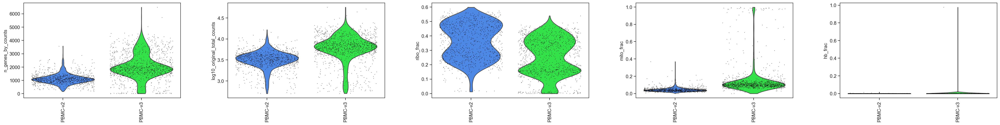

In [12]:
sc.pl.violin(adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

#### 1.2.1 Identify doublets

We will use scanpy's implementation (`scanpy.external.pp.scrublet` function) of scrublet (https://github.com/swolock/scrublet) to predict doublets. This command will use the default parameters of `scanpy.external.pp.scrublet`, however, if you are feeling brave and disagree with the predicted parameters you can use this scrublet's example notebook (https://github.com/swolock/scrublet/blob/master/examples/scrublet_basics.ipynb) to alter them to your preferred ones.

In [13]:
sc.external.pp.scrublet(adata, random_state=42) # run scrublet to predict potential doublets

Running Scrublet
filtered out 17620 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
Automatically set threshold at doublet score = 0.31
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 41.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 1.7%
    Scrublet finished (0:00:02)


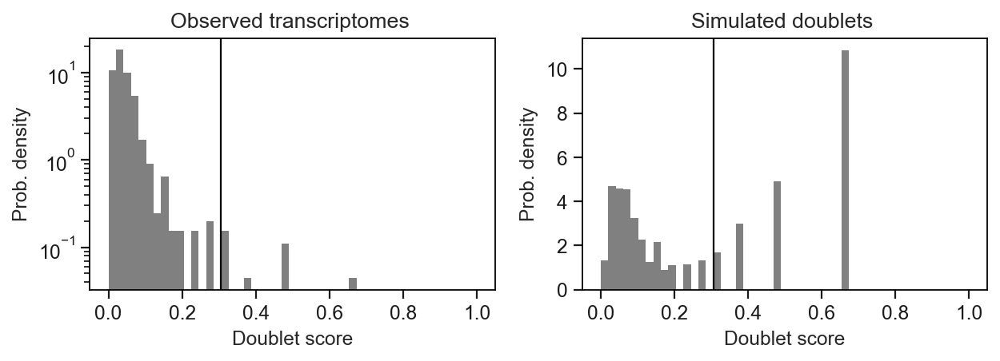

In [14]:
sc.external.pl.scrublet_score_distribution(adata) # inspect automatic threshold

✍️ Because automatic threshold was not optimal, here we adjusted the threshold manually to make it more stringent.

In [15]:
sc.external.pp.scrublet(adata, threshold=0.17, random_state=42) # choose threshold manually

Running Scrublet
filtered out 17620 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 50.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.1%
    Scrublet finished (0:00:02)


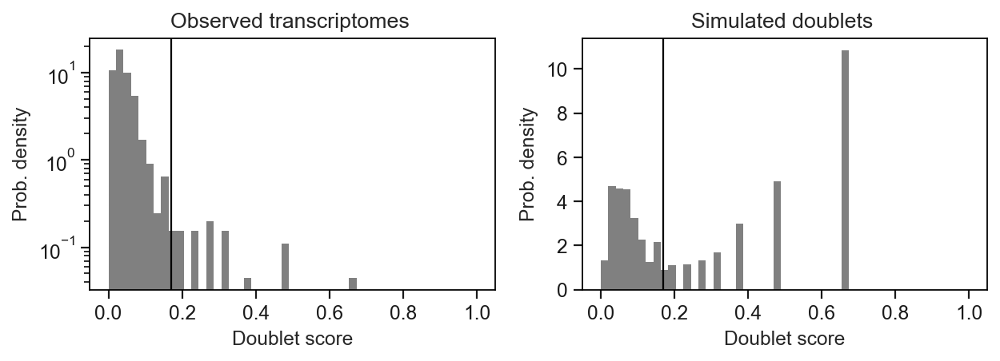

In [16]:
sc.external.pl.scrublet_score_distribution(adata) # inspect manual threshold

#### 1.2.2 Remove not expressed genes

✍️ We will remove genes that are not expressed in any cells across our samples, as these genes will not contribute to any biological insight, but rather may affect downstream analysis speed. This step can become more stringent by providing a higher number of cells in the `min_cells` field.

In [17]:
sc.pp.filter_genes(adata, min_cells=1) # remove columns with all 0s

filtered out 14557 genes that are detected in less than 1 cells


#### 1.2.3 Remove ribosomal and hemoglobin genes

Ribosomal and hemoglobin genes constitute a high percentage of the total read counts, and they can affect downstream analysis and interpretation of our data, therefore, here we remove these genes before further processing.

In [18]:
adata = adata[:,adata.var['ribo']==False]
adata.shape # check number of genes after ribosomal gene removal

(2218, 18881)

In [19]:
adata = adata[:,adata.var['hb']==False]
adata.shape # check number of genes after hemoglobin gene removal

(2218, 18872)

#### 1.2.3 Normalize each cell's library size

Next, we will normalize each cell to a total library size of 10,000 reads. The `adata.X` field will be updated automatically with the normalized counts.

In [20]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10**4)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


❗ Raw data can be recovered via the `adata.raw` field.

#### 1.2.4 Log-transform counts

We will also *log*-transform the gene counts here using scanpy's `sc.pp.log1p` function. This function uses the `log(X+1)` formula, in which *log* denotes the natural logarithm.

In [21]:
sc.pp.log1p(adata)

### 1.3 Select a subset of principal components 

Prior to plotting our data in a 2-dimensional space (in this case using scanpy's `sc.pl.umap` function), we need to select a small number of principal components to reduce the noise of this multitude of data and as well increase the execution speed.

For that, we will first select a large number of principal components and visualize the percentage of variance explained by each component.

*For fun, here and in all the cases that we need to set a seed, we will use the **number 42**, the answer to the Ultimate Question of Life, the Universe, and Everything.*

In [22]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(adata, n_comps=200, svd_solver='arpack', random_state=rng)

computing PCA
    with n_comps=200
    finished (0:00:07)


<function matplotlib.pyplot.show(close=None, block=None)>

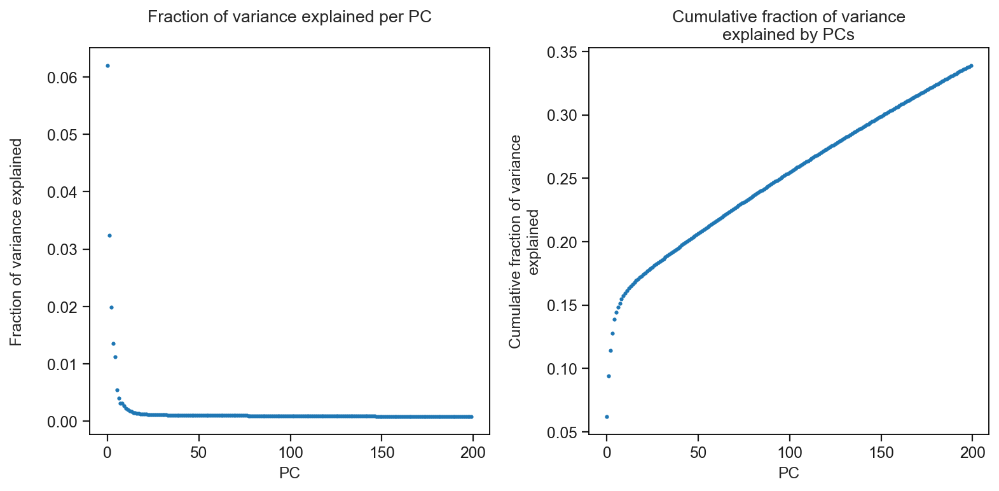

In [23]:
observe_variance(adata)

❗ We want to include all the principal components before the 'knee point' (the point where the fitted curve would change slope the most), because these likely represent important sources of variance in our data. To try and avoid eliminating any relevant but small sources of variance, we will choose a number of PCs slightly to the right of the knee point. 

✍️ Replace the number in the `n_comps` field with your principal components selection.

In [24]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(adata, n_comps=30,  svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(adata)

computing PCA
    with n_comps=30
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


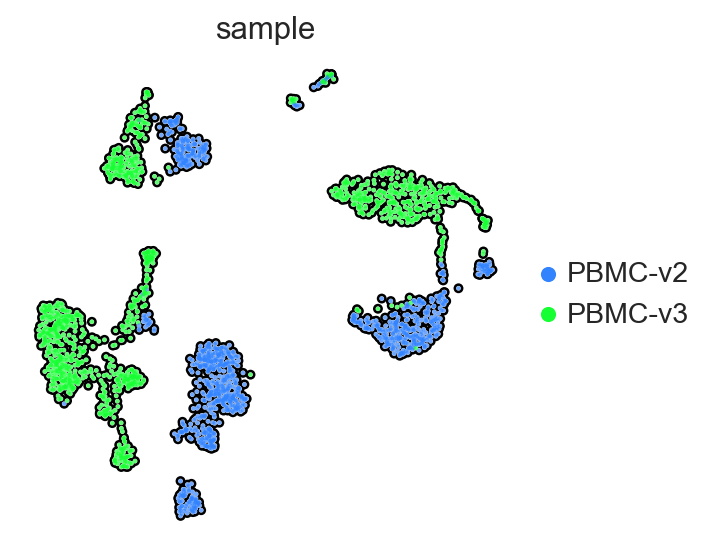

In [25]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['sample'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

❗ **Does your data look well distinguished?** If yes, move ahead. If no, maybe try to increase (or decrease) the number of principal components you used, and rerun the last bits of code.

### 1.4 Run unsupervised clustering analysis with leiden

Next, we perform leiden clustering analysis using consecutive resolution parameters and visualize the resulting clusters in the respective generated UMAPs. We can then visually select an optimal number of clusters that better identify contaminant populations and also clusters of cells that have a combination of "bad" quality measures. Here, we aim to remove as cleanly as possible bad quality cells and cell contaminants that we don't want carry in our downstream analysis.   

In [26]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden cluste

We can visualize the clustering to see which clusters match with the cells that we would like to filter out. Inspect the list of QC metrics and canonical markers to make your choice.

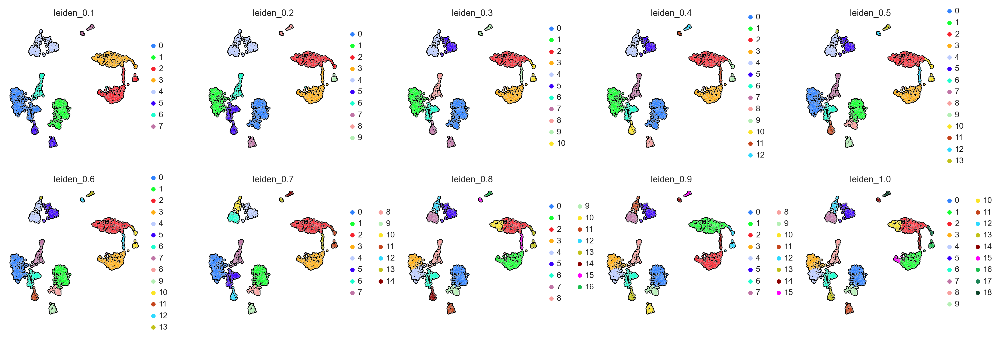

In [27]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

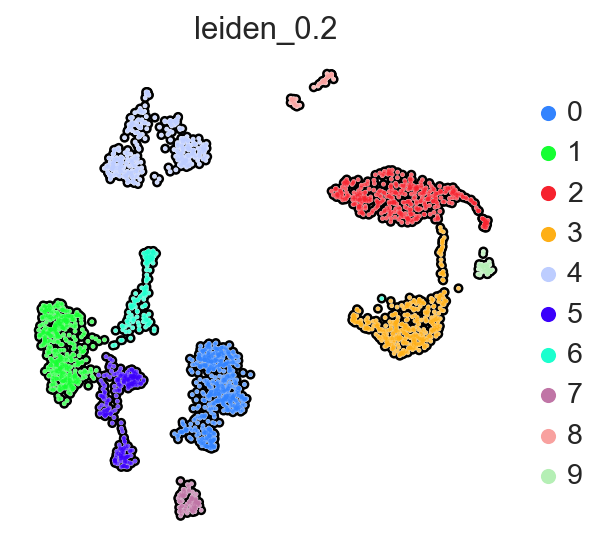

In [28]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.2'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

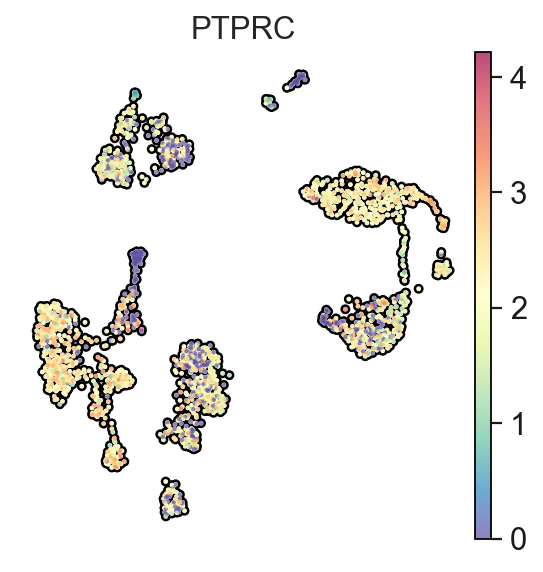

In [29]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['PTPRC'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

❗ Store total number of cells prior to any filtering to use for a per sample summary cells that did not pass QC visual

In [30]:
adata_memo = adata

### 1.5 Filter out bad quality cells and other cell contaminants by cluster

Now inspect the QC metrics for each of the clusters and choose to remove any clusters that may have a combination of bad quality metrics.

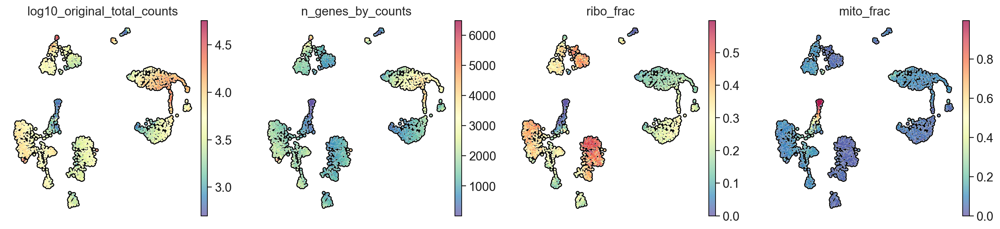

In [31]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

✍️ Choose which clusters you want to remove, and add them to the list clusters_to_remove below.

In [32]:
clusters_to_remove = ['6', '8']
cluster_filter = [x not in clusters_to_remove for x in adata.obs['leiden_0.2']]
print('Total number of cells pre-filtering: ' + str(adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
adata_filtered = adata[cluster_filter]

Total number of cells pre-filtering: 2218
Number of cells to keep after filtering: 2063


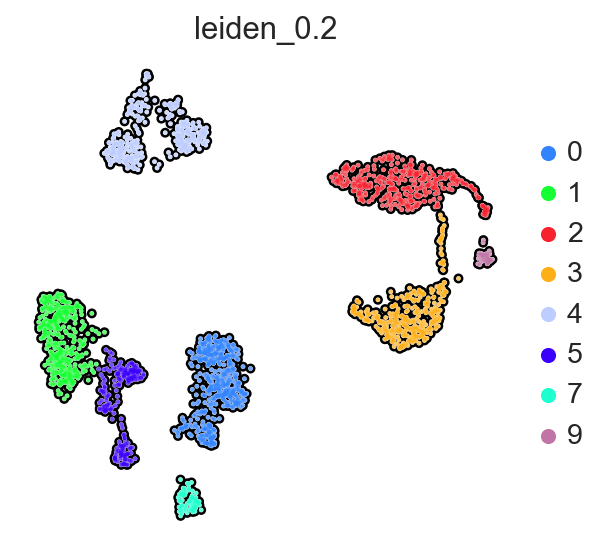

In [33]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata_filtered, 
    color=['leiden_0.2'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

❗ **Were the correct clusters removed?** If the bad quality cells and doublets are removed, run the next line to store the result in your adata object and continue with the analysis.

In [34]:
adata = adata_filtered

In [35]:
adata.shape

(2063, 18872)

### 1.6 Filter out doublets

This would be also a good spot to remove the doublets that we have identified above. We first inspect where the predicted doublets lie on the UMAP and then we proceed to remove them.

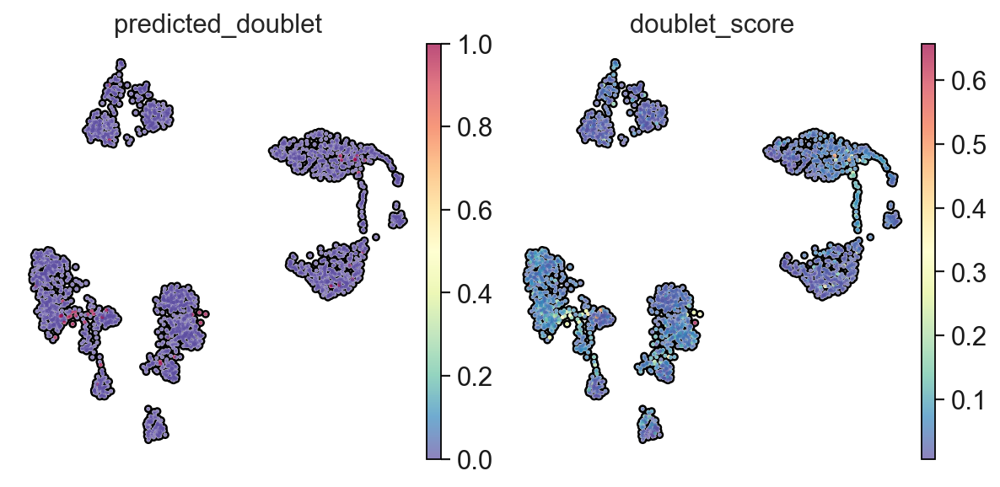

In [36]:
sc.pl.umap(
    adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [37]:
adata = adata[adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

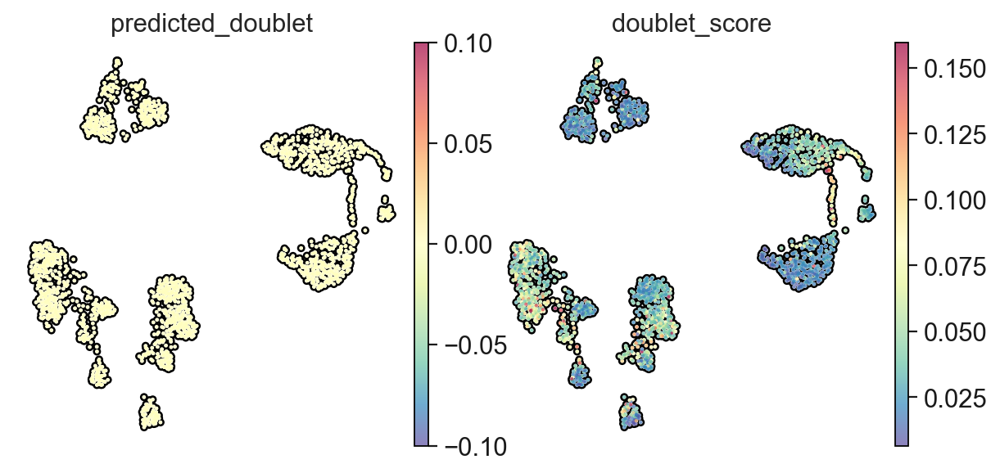

In [38]:
sc.pl.umap(
    adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

Let's now check the exact number of doublet cells that were removed from the dataset.

In [39]:
adata.shape

(2020, 18872)

### 1.7 Inspect the data after removal of "unwanted" cells

Here, we create annotation for the cells that have been removed or kept to visualize them in a UMAP and a stacked barplot format.

In [40]:
adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([adata.obs['keep_cell']])
adata_memo.obs['keep_cell'] = '1.no'

In [41]:
adata_memo.obs['keep_cell'][adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

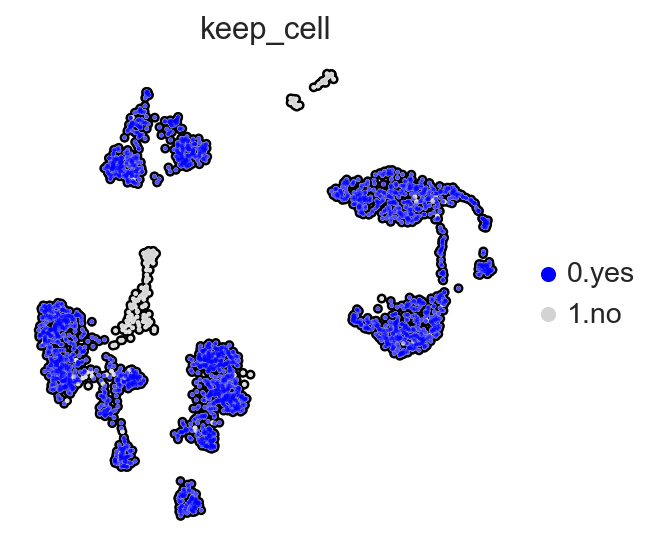

In [42]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [43]:
crosstb = pd.crosstab(adata_memo.obs['sample'], adata_memo.obs['keep_cell'])

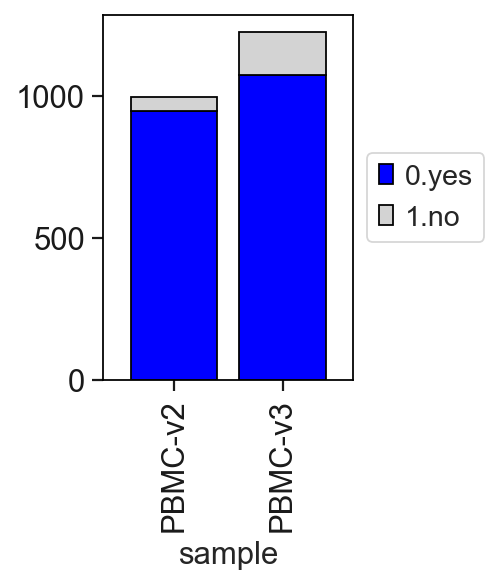

In [44]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

**Inspect QC generic metrics**

Replotting the summarized violin plots with the quality metrics calculated in `section 1.2` after removal of "unwanted" cells.

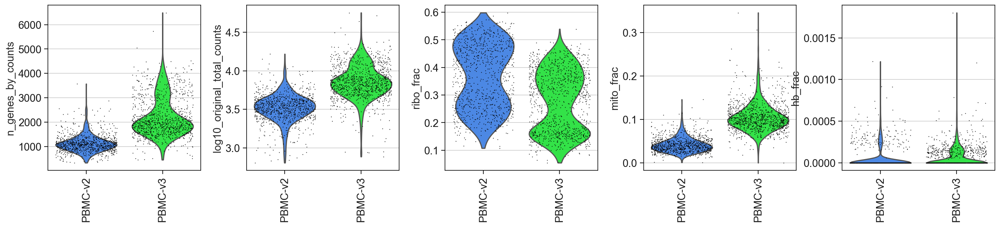

In [45]:
sc.pl.violin(adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

### 1.8 Reanalyze the data after removal of "unwanted" cells

Once we have removed all "unwanted" cells, we need to reanalyze our data in a similar way to sections 1.3 and 1.4 above. 

In [46]:
rng = np.random.RandomState(42)
adata = sc.tl.pca(adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

computing PCA
    with n_comps=200
    finished (0:00:06)


<function matplotlib.pyplot.show(close=None, block=None)>

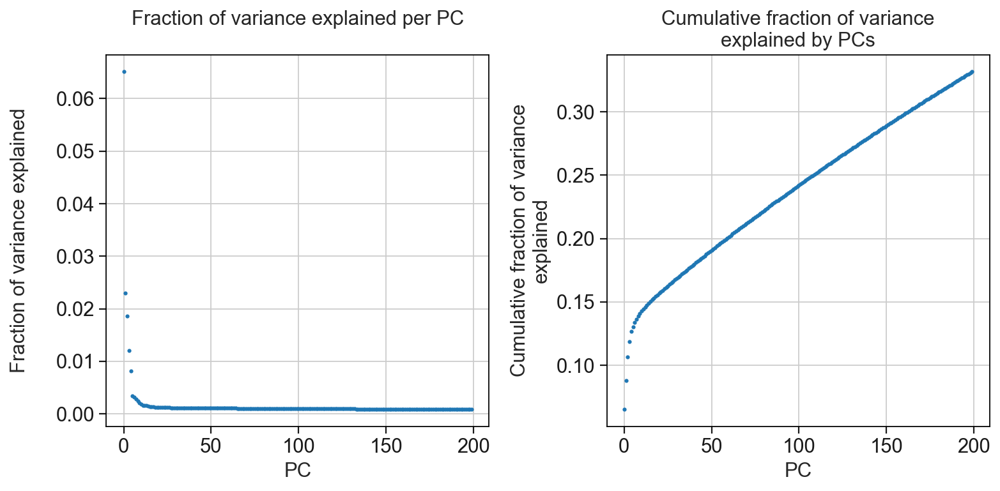

In [47]:
observe_variance(adata)

✍️ Remember to choose here a different number of principal components based on the re-analysis.

In [48]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(adata, n_comps=25, svd_solver='arpack', random_state=rng)
sc.pp.neighbors(adata, n_neighbors=15)
sc.tl.umap(adata)

computing PCA
    with n_comps=25
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 25
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


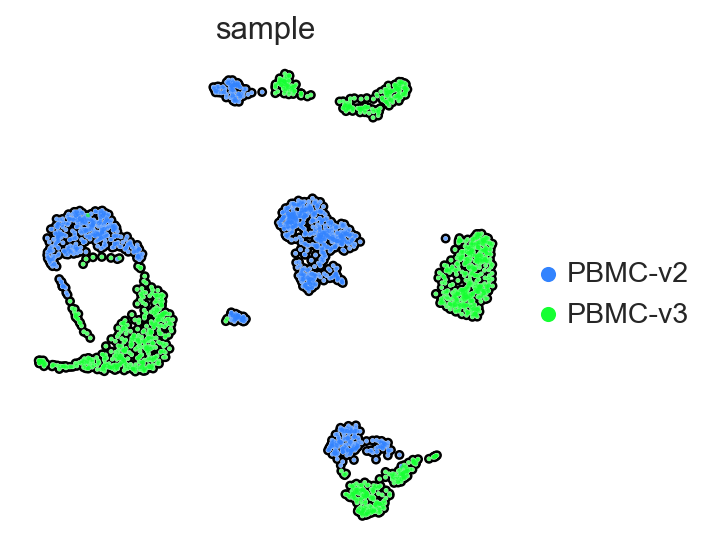

In [49]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['sample'], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

As previously, we perform leiden clustering analysis using consecutive resolution parameters and visualize the resulting clusters in the respective generated UMAPs. Here, we opt to select the number of clusters that better previously known populations (based on the expression of canonical markers), and also *de-novo* populations of cells that look well separated in the UMAP representation.

In [50]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden cluster

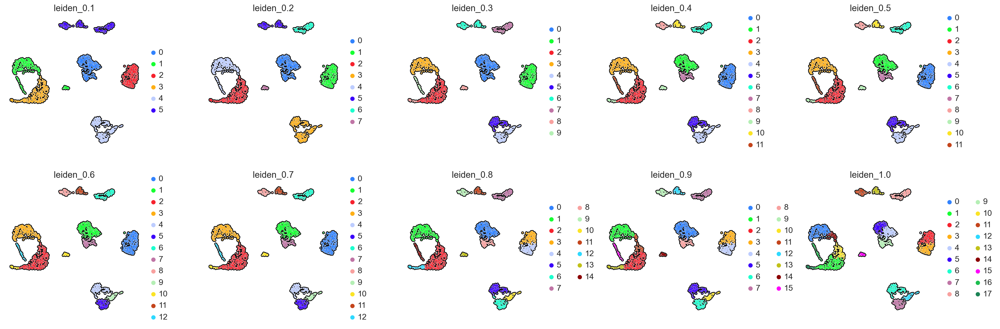

In [51]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

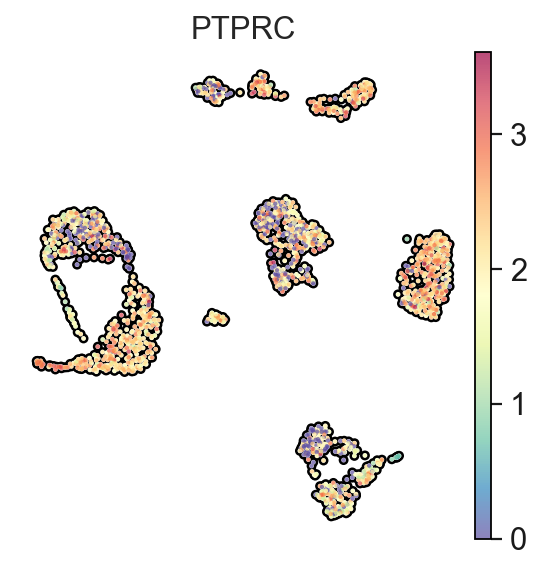

In [52]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['PTPRC'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

You are done! Just save you anndata object to come back to it later. Make sure your path ends with the desired filename including the .h5ad file extension. You can now come back to this dataset at anytime.

In [53]:
path_to_h5ad = '../output/metadata/anndata_objects/shunPykeR.h5ad'

In [54]:
adata.write(path_to_h5ad)

In [55]:
# code to read back your saved h5ad object
adata = sc.read_h5ad(path_to_h5ad)
adata.uns['log1p']["base"] = None

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='phase'></a>

## 2 Regress out cell cycle (optional)

### 2.1 Compute cell cycle phase

We will use scanpy's function `sc.tl.score_genes_cell_cycle function` to assign a cell cycle phase (S, G2M and G1) to our cells. See here (https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.score_genes_cell_cycle.html) for more details of how the function works.

In [56]:
# showing cell cycle signatures
cell_cycle_genes = [x.strip().upper() for x in open('../data/regev_lab_cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
# for cell cycle
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    600 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    516 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


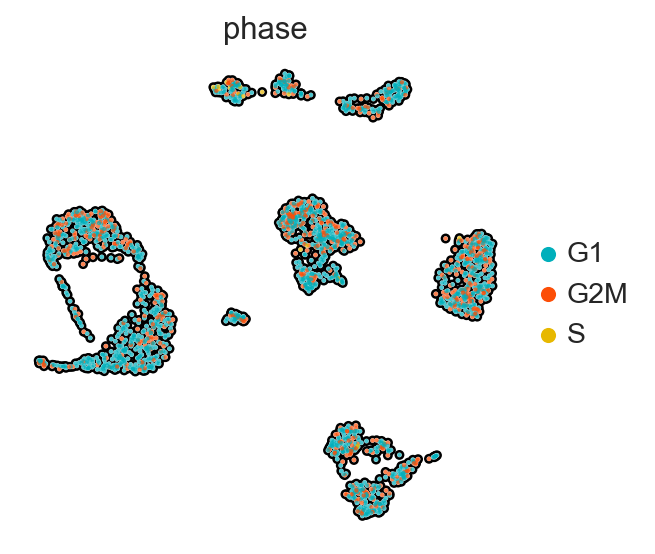

In [57]:
adata.uns['phase_colors'] = ["#00AFBB", "#FC4E07", "#E7B800"]
sc.pl.umap(
    adata,
    color= ['phase'],
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### 2.2 Regress cell cycle effect out and reanalyze the data

To regress out the cell cycle phase that we calculated above we can use scanpy's function `sc.pp.regress_out` and replace `adata` with `adata_no_cc` in the next steps.

⏳ This step can be very time consuming.

In [58]:
adata_no_cc = sc.pp.regress_out(adata, ['S_score', 'G2M_score'], n_jobs=4, copy=True)

regressing out ['S_score', 'G2M_score']
    sparse input is densified and may lead to high memory use
    finished (0:00:29)


Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='harmony'></a>

## 3 Correct for batch effects with harmony (optional)

When ispecting the annotated by sample UMAP above, it is likely that samples from different experiments do not properly overlap, despite having shared populations, due to small but consistent technical effects (batches) across each dataset that influence their projection. We can initially attempt to correct for this by choosing only highly variable genes (hvgs) when running scanpy's `sc.tl.pca` function. This will create the UMAP based on the biggest differences of the existing populations and may salvage the technical noise that is more apparent when running the  analysis across all genes.

In [59]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


As above, observe and choose an optimal number of components based on the "knee point" of the curve below.

In [60]:
rng = np.random.RandomState(42)
sc.tl.pca(adata, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:00)


<function matplotlib.pyplot.show(close=None, block=None)>

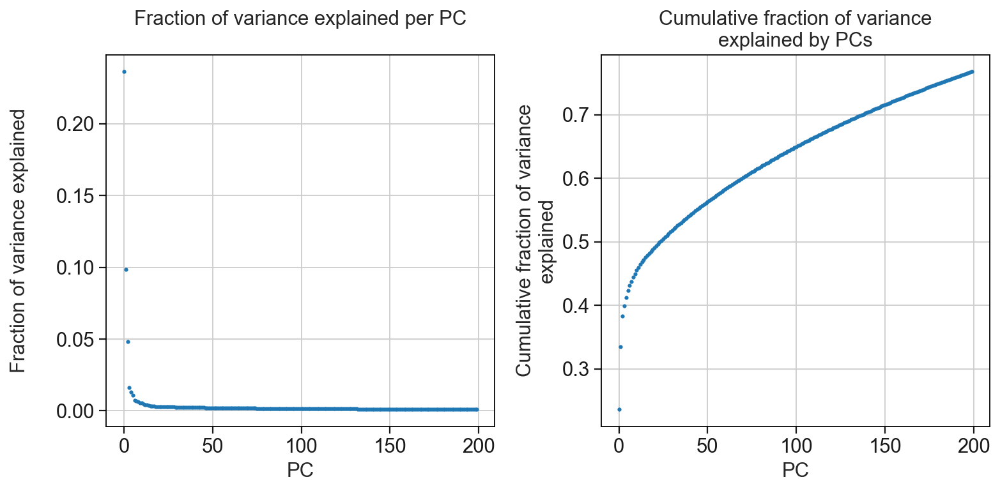

In [61]:
observe_variance(adata)

In [62]:
rng = np.random.RandomState(42)
sc.tl.pca(adata, n_comps=30, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:00)


### 3.1 hvgs without batch effect correction

In [63]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pca')
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


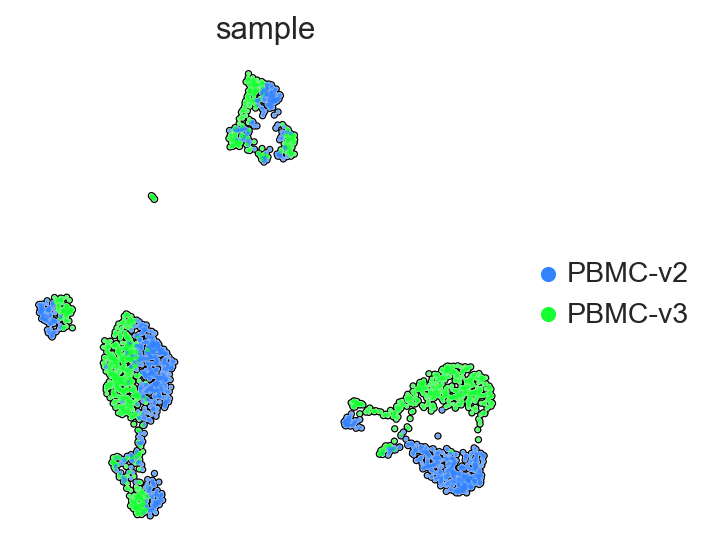

In [64]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(adata,
               color=['sample'],
               use_raw=False,
               frameon=False, 
               color_map='Spectral_r',
               size=15,
               add_outline=True,
               wspace = 0.5,
               ncols = 4
              )

### 3.2 hvgs with batch effect correction

If selecting hvgs does not improve the UMAP projection for our samples, we can additionally use a batch effect correction algorithm to remove the technical noise of the samples. 

In [65]:
sce.pp.harmony_integrate(adata, 'sample')

2023-01-06 18:46:53,889 - harmonypy - INFO - Iteration 1 of 10
2023-01-06 18:46:54,090 - harmonypy - INFO - Iteration 2 of 10
2023-01-06 18:46:54,273 - harmonypy - INFO - Iteration 3 of 10
2023-01-06 18:46:54,343 - harmonypy - INFO - Iteration 4 of 10
2023-01-06 18:46:54,420 - harmonypy - INFO - Iteration 5 of 10
2023-01-06 18:46:54,500 - harmonypy - INFO - Iteration 6 of 10
2023-01-06 18:46:54,622 - harmonypy - INFO - Iteration 7 of 10
2023-01-06 18:46:54,721 - harmonypy - INFO - Iteration 8 of 10
2023-01-06 18:46:54,800 - harmonypy - INFO - Iteration 9 of 10
2023-01-06 18:46:54,857 - harmonypy - INFO - Iteration 10 of 10
2023-01-06 18:46:54,935 - harmonypy - INFO - Stopped before convergence


In [66]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


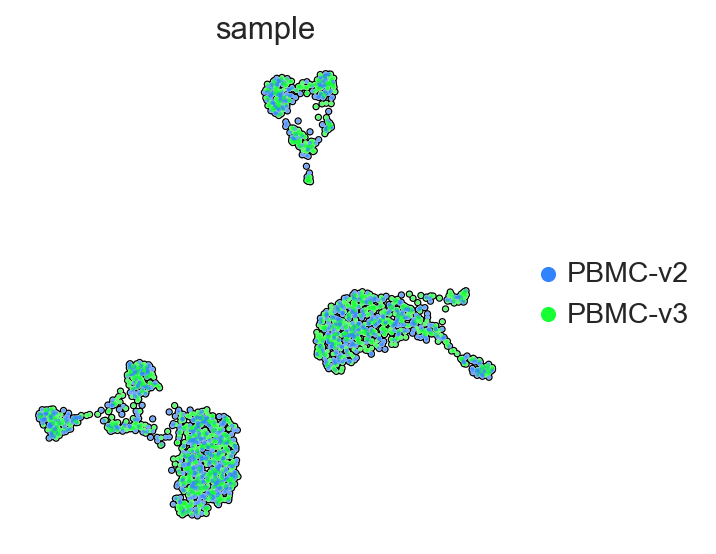

In [67]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(adata,
               color=['sample'],
               use_raw=False,
               frameon=False, 
               color_map='Spectral_r',
               size=15,
               add_outline=True,
               wspace = 0.5,
               ncols = 4
              )

💡 **What if nothing works?** Again, don't panick! It may be a bit trickier but you can scan the literature for canonical markers and annotate your clusters based on these markers despite the UMAP. Just keep in mind that differences between the samples on a UMAP can be biologically significant so proceed with caution when applying any type of batch effect correction to your data.

### 3.3 Rerun leiden clustering after harmony correction

Once we have updated the pca components we use to compute the UMAP, we need to rerun leiden clustering analysis using consecutive resolution parameters and visualize the resulting clusters in the respective generated UMAPs to choose an appropriate UMAP.

In [68]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering

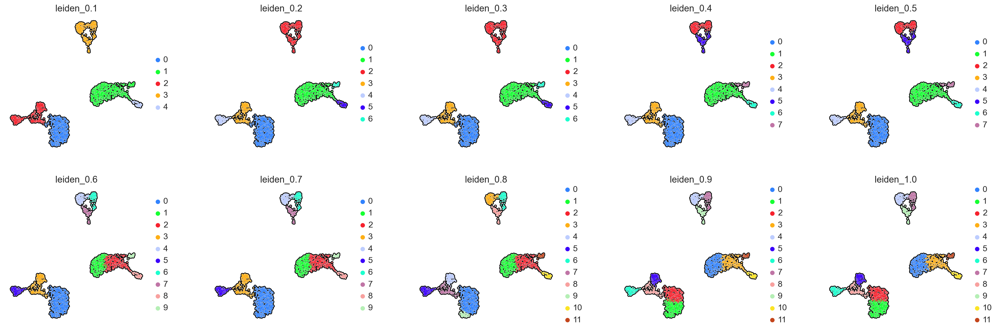

In [69]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

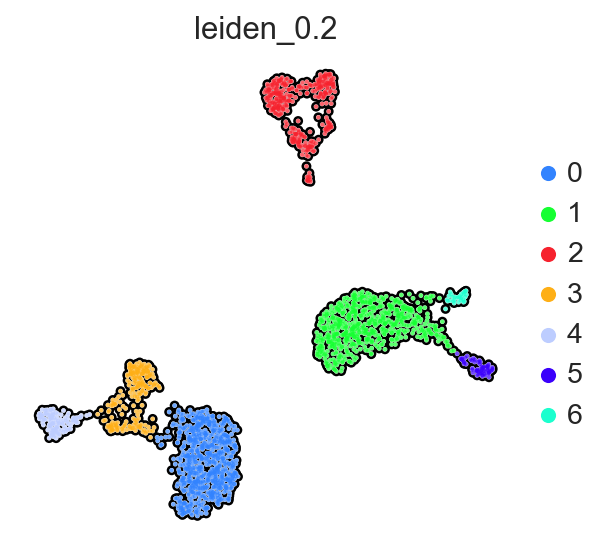

In [70]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.2'], 
    use_raw=False,
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='basicgraphs'></a>

## 4 Inspect basic data visualization

This part explores options for data visualization for canonical marker genes, differentially expressed genes and other genes of interest. We provide here four commonly used plots to observe gene expression and population frequencies in single cell data. For more visualization optios, please see scanpy's `Core plotting functions` tutorial (https://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html).

✍️ To start plotting, first save your genes of interest in a list, named here `marker_genes`. In the example below we use an extended list of canonical markers for the PBMC dataset in an effort to identify the identity of our clusters.

❗ Interogate markers of interest (if known), otherwise skip to the DEG section to identify marker genes for your unknown clusters.

In [71]:
marker_genes = ['MS4A1', 'CD14', 'LYZ', 'MS4A7', 'FCGR3A','CST3', 'FCER1A', 'IL7R', 'CD8A',  'NKG7', 'GNLY']

💡 **Hint:** Individual gene names need to be in quotes and separated by commas as shown below. These are also case and name sensitive, so if you are working with mouse, human or other assemblies make sure you use the appropriate format.

### 4.1 Create group annotation

❗ All plotting functions require a grouping factor to divide the data by. Choose from existing metadata, or create new metadata on your own.

We want to create a new annotation called `cell_type`. For that, we first need to identify what populations we have in our samples. Thus, we use a curated gene list (the one defined above) to inspect the expression of these genes in our data. 

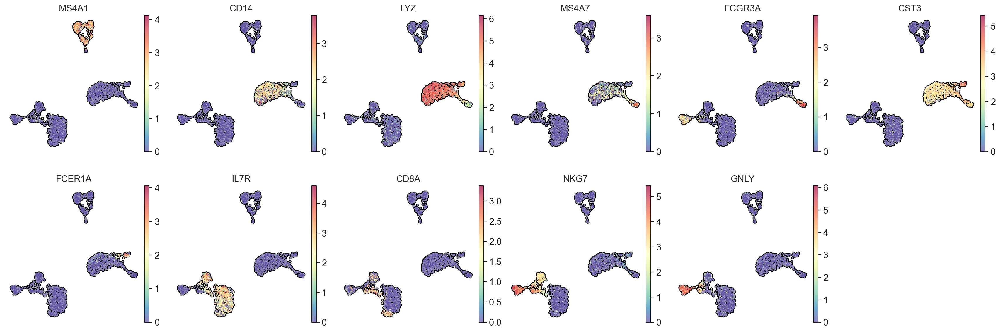

In [72]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=marker_genes, 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

Based on these canonical markers we can go ahead and rename our leiden clusters into the appropriate cell type, creating a new annotation field `cell_type`. We can then use this field for data visualization and other downstream analysis.

In [73]:
# using exact match
adata.obs['cell_type'] = ['B' if x=='2' else 
                          'CD14+ Monocytes' if x=='1' else
                          'FCGR3A+ Monocytes' if x=='5' else
                          'CD8 T' if x=='3' else
                          'CD4 T' if x=='0' else
                          'NK cells' if x=='4' else
                          'DCs' if x=='6' else 'ERROR' for x in adata.obs['leiden_0.2']] 

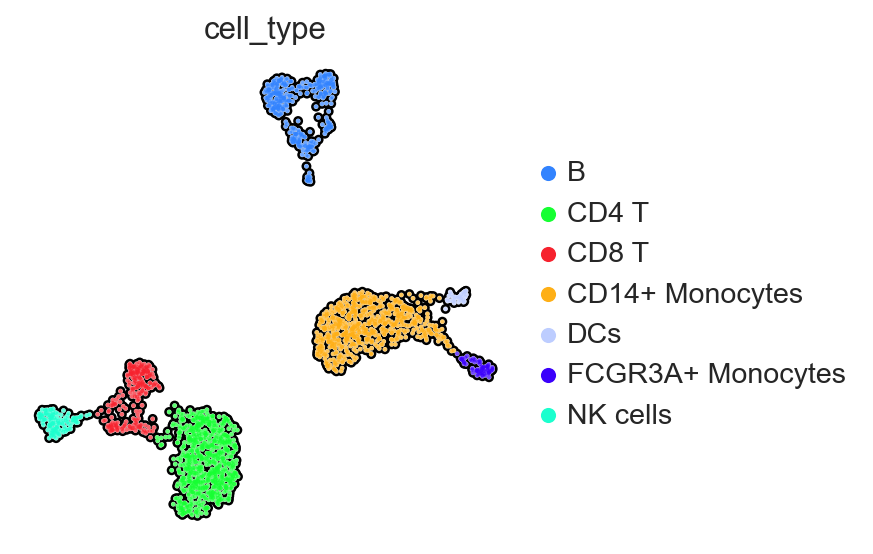

In [74]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['cell_type'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### 4.2 Explore visualization plots

In the examples below we are using the `cell_type` as the `groupby` parameter for plotting purposes. This can be replaced by any other grouping factor that has been applied in the data. See `section 4.1` on how to create a grouping factor.

#### 4.2.1 Dotplot

Scanpy's `sc.pl.dotplot` function shows average expression and fraction of cells expressing a gene per group, for each of the genes of interest. Check scanpy's dotplot man page (https://scanpy.readthedocs.io/en/latest/generated/scanpy.pl.dotplot.html#scanpy.pl.dotplot) for a list of parameters and types of input.

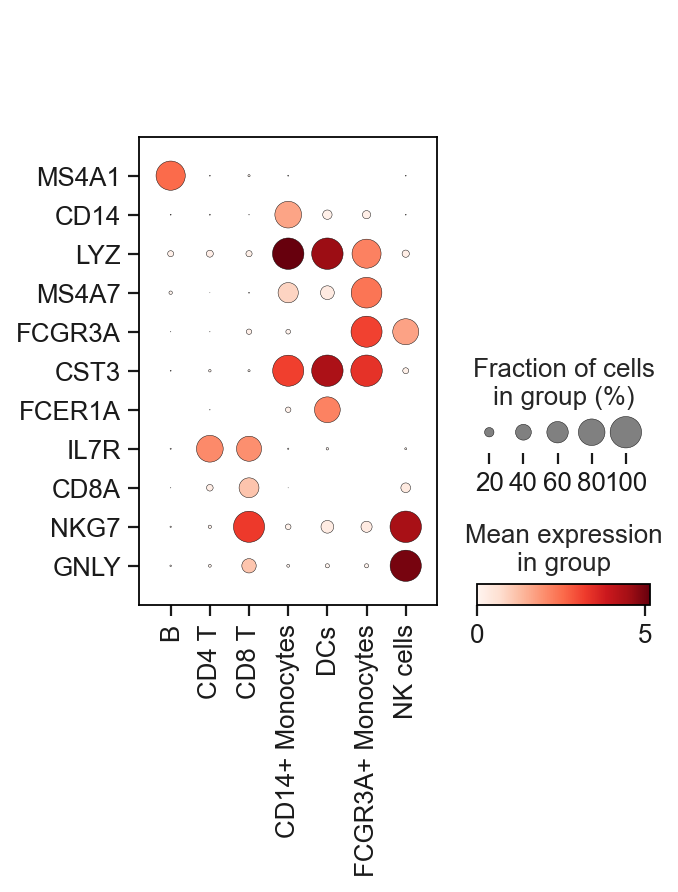

In [75]:
sc.pl.dotplot(adata, marker_genes, groupby='cell_type', swap_axes=True, use_raw=False) 

#### 4.2.2 Stacked violin plot

Scanpy's `scanpy.pl.stacked_violin` function creates violin plots for each of the genes of interest. Check scanpy's stacked violin man page (https://scanpy.readthedocs.io/en/latest/generated/scanpy.pl.stacked_violin.html?highlight=sc.pl.stacked_violin) for a list of parameters and types of input.

    using 'X_pca' with n_pcs = 30
Storing dendrogram info using `.uns['dendrogram_cell_type']`


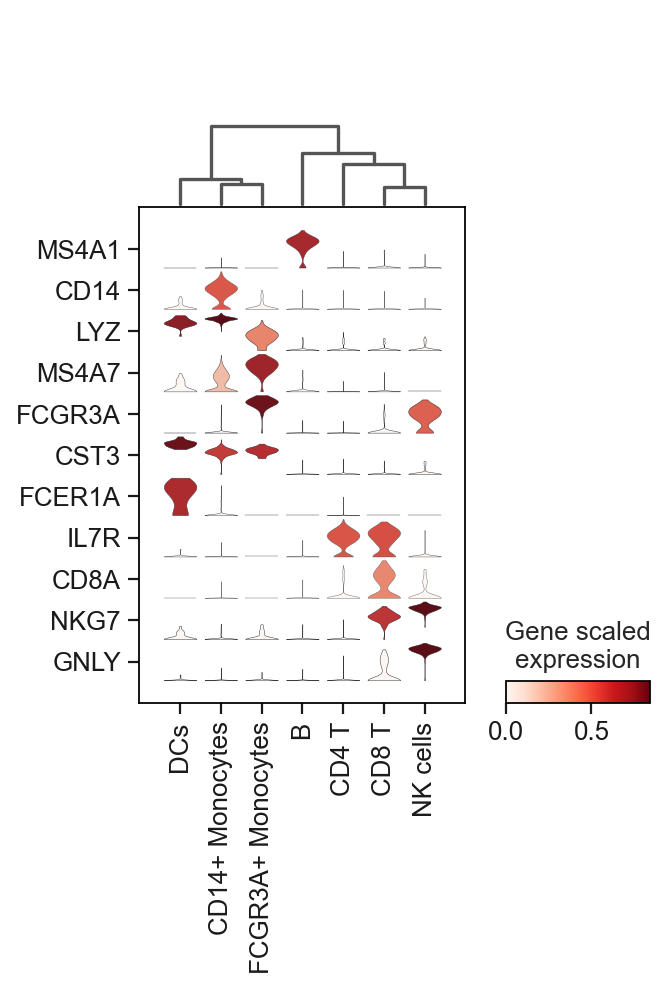

In [76]:
sc.pl.stacked_violin(adata, marker_genes, groupby='cell_type', swap_axes=True, standard_scale='var', cmap='Reds', dendrogram=True, use_raw=False, colorbar_title='Gene scaled\nexpression') 

#### 4.2.3 Heatmap

Scanpy's `sc.pl.heatmap` function creates a heatmap for all the genes of interest. Check scanpy's heatmap man page (https://scanpy.readthedocs.io/en/latest/generated/scanpy.pl.heatmap.html#scanpy-pl-heatmap) for a list of parameters and types of input.

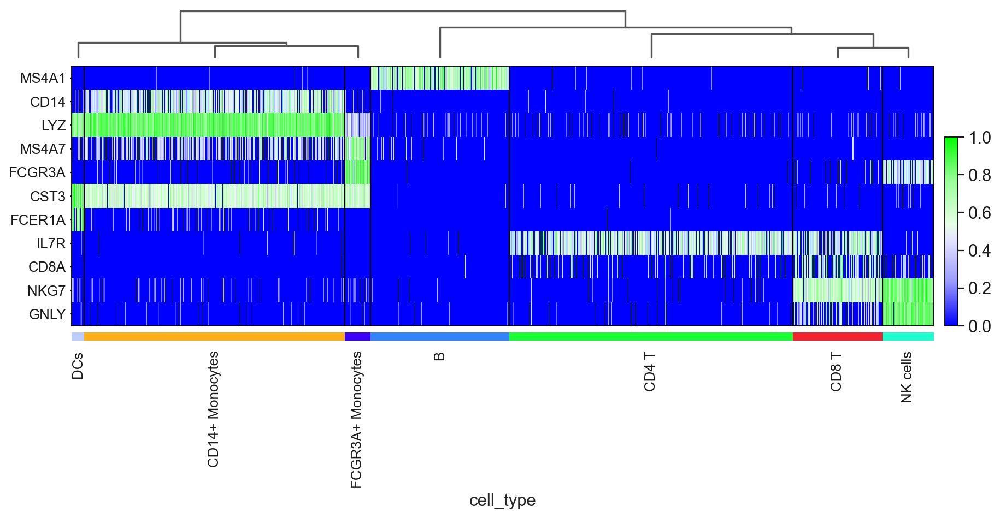

In [77]:
ax = sc.pl.heatmap(adata, marker_genes, groupby='cell_type', figsize=(13, 5), cmap=user_defined_cmap_degs, standard_scale='var',     use_raw=False, dendrogram=True, swap_axes=True)

#### 4.2.4 Stacked barplots

We can take advantage of pandas crosstab function to format our data for a barplot. We need to grouping factors (the order matters!) to create this type of frequencies table, prior to making a barplot using python's matplotlib package.

In [78]:
crosstb = pd.crosstab(adata.obs['sample'], adata.obs['cell_type'], normalize='index')

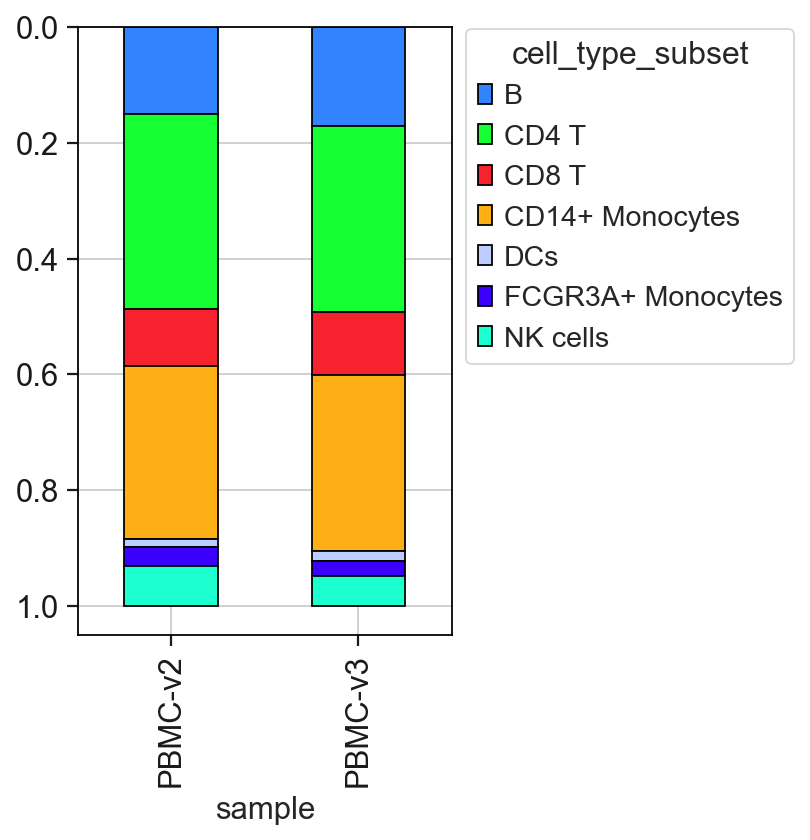

In [79]:
plt.rcParams['figure.figsize'] = [3, 5]

ax = crosstb.plot(kind='bar', stacked=True,  edgecolor = "black", color=adata.uns['cell_type_colors'])
ax.invert_yaxis()
ax.legend(title='cell_type_subset', bbox_to_anchor=(1, 1.02), loc='upper left')

#### 4.2.5 Delta difference barplots

If we are more interested to highlight the magnitude of the change, regardless the size of the population, we can calculate the delta difference between two conditions per group as shown below.

In [80]:
crosstb = pd.crosstab(adata.obs['sample'], adata.obs['cell_type'], normalize='index')
diffcrosstb = ((crosstb.loc["PBMC-v3"] - crosstb.loc["PBMC-v2"]) / (crosstb.loc["PBMC-v3"] + crosstb.loc["PBMC-v2"]))*100

In [81]:
crosstb

cell_type,B,CD4 T,CD8 T,CD14+ Monocytes,DCs,FCGR3A+ Monocytes,NK cells
sample,,,,,,,
PBMC-v2,0.149947,0.337909,0.098205,0.298838,0.012672,0.033791,0.068638
PBMC-v3,0.171482,0.320596,0.109040,0.304753,0.016775,0.026095,0.051258


In [82]:
pd.DataFrame(diffcrosstb)

,0
cell_type,
B,6.699652
CD4 T,-2.629093
CD8 T,5.228218
CD14+ Monocytes,0.979900
DCs,13.936234
FCGR3A+ Monocytes,-12.850851
NK cells,-14.495609


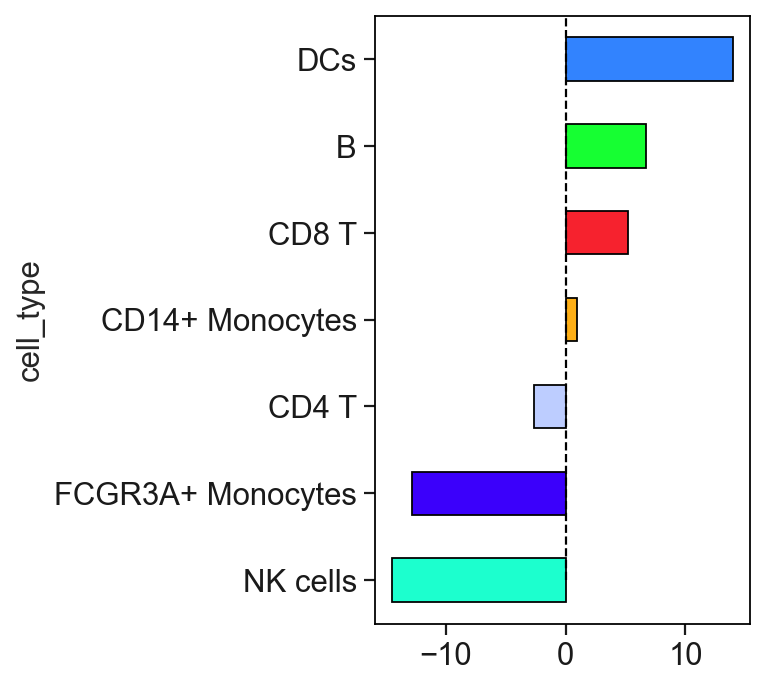

In [83]:
subset_palette = ['#3283fe', '#16ff32', '#f6222e', '#feaf16', '#bdcdff', '#3b00fb', '#1cffce'][::-1]
with rc_context({'figure.figsize': (3, 5)}):
    ax = diffcrosstb.sort_values(ascending=True).plot(kind="barh", stacked=True, edgecolor = "black", color=subset_palette)
    ax.grid(False)
    ax.add_artist(lines.Line2D([0,0], [0,100], color='black',  lw=1,  ls='--'))
    ax.plot(legend=None)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='magic'></a>

## 5 Denoise and impute genes with magic (optional)

The magic package can be used to impute the expression of genes in our data. This is advised for genes that are lowly expressed (e.g. transcription factors) and are more prone to dropouts. Please follow the instructions here (https://github.com/dpeerlab/magic) to install magic before running the section below. 

In [84]:
import magic

Run the code below to set up magic before you use it.

In [85]:
magic_op = magic.MAGIC()

In [86]:
magic_op.set_params(knn=5, t=4)

MAGIC(knn_max=15, t=4)

As before, we create a list of genes to impute. Choosing all genes is an option, but it will be very time consuming.


In [87]:
emt_genes = ['VIM', 'ZEB2', 'CDH1']

❗ We choose to store the imputed values in a new anndata object named `adata_magic`. We do that because the imputation will transform the gene expression values of our data and we don't want to carry along the transformed values in the next parts of our analysis.

In [88]:
adata_magic = magic_op.fit_transform(adata, genes=emt_genes)

Calculating MAGIC...
  Running MAGIC on 2020 cells and 18872 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.57 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.31 seconds.
  Calculated graph and diffusion operator in 2.19 seconds.
  Calculating imputation...
Calculated MAGIC in 2.24 seconds.


⏳ May take quite some time to complete if you have selected `"all_genes"` as the `genes` parameter.

For completeness, we tranfer group colors annotation to the new `adata_magic` object.

In [89]:
adata_magic.uns['cell_type_colors'] = adata.uns['cell_type_colors'] 

### 5.1 Visualize magic imputed data in a scatterplot

Scanpy's `sc.pl.scatter` function can be used here to show the correlation between two imputed genes. It can also show an additional coloring parameter, may it be a grouping factor or gene expression of an imputed gene. Check scanpy's scatter man page here (https://scanpy.readthedocs.io/en/latest/generated/scanpy.pl.scatter.html#scanpy-pl-scatter) for a list of parameters and types of input.

<AxesSubplot:title={'center':'After magic imputation'}, xlabel='CDH1', ylabel='VIM'>

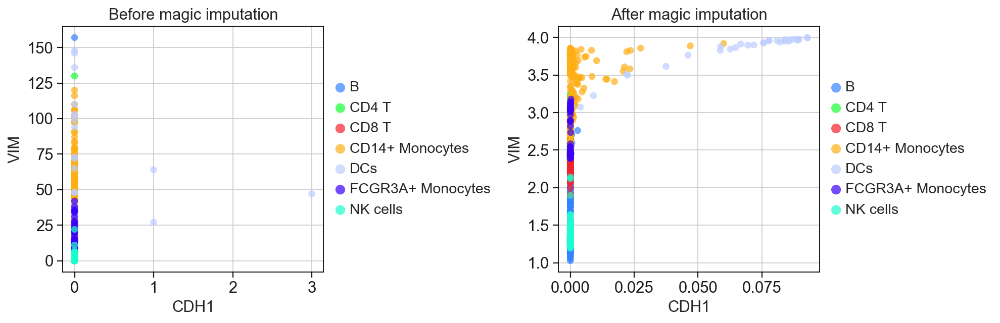

In [90]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4), gridspec_kw={'wspace':0.9})
    
sc.pl.scatter(adata, x='CDH1', y='VIM',color='cell_type', palette=adata_magic.uns['cell_type_colors'], projection='2d', alpha=0.7, size=150, title = 'Before magic imputation', ax=ax1, show=False)
sc.pl.scatter(adata_magic, x='CDH1', y='VIM',color='cell_type', palette=adata_magic.uns['cell_type_colors'], projection='2d', alpha=0.7, size=150, title = 'After magic imputation', ax=ax2, show=False)

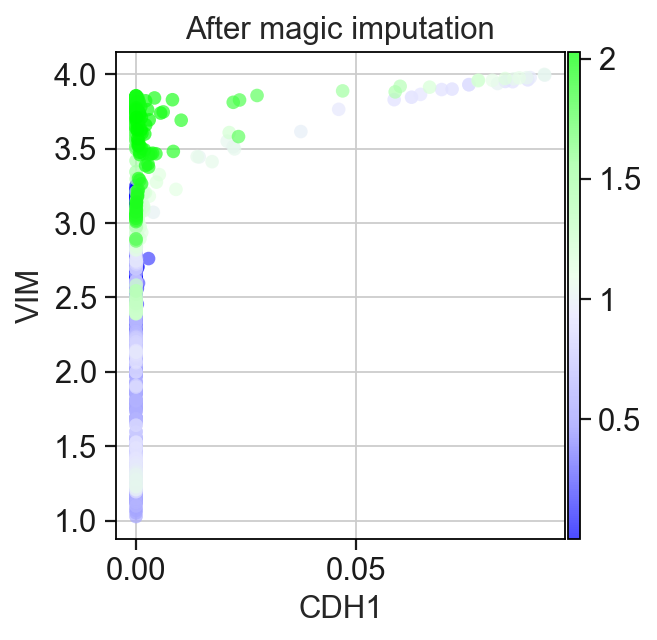

In [91]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)

sc.pl.scatter(adata_magic, x='CDH1', y='VIM', color='ZEB2', color_map=user_defined_cmap_degs, projection='2d', alpha=0.7, size=150,  title = 'After magic imputation')

### 5.2 Visualize magic imputed data in a sorted heatmap

Another option can be visualizing the imputed values of your list of genes in a heatmap but sorted by the expession of a specific imputed gene. For that we first need to add the imputed values of the gene of interest as a grouping factor in our metadata.

In [92]:
adata_magic.obs['vim_time'] = pd.DataFrame(adata_magic.X, columns=adata_magic.var.index)['VIM'].values

 Next, we take advantage of the `scv.pl.heatmap` function from the scvelo package (https://scvelo.readthedocs.io/en/stable/) to create a heatmap sorted by that gene expession.

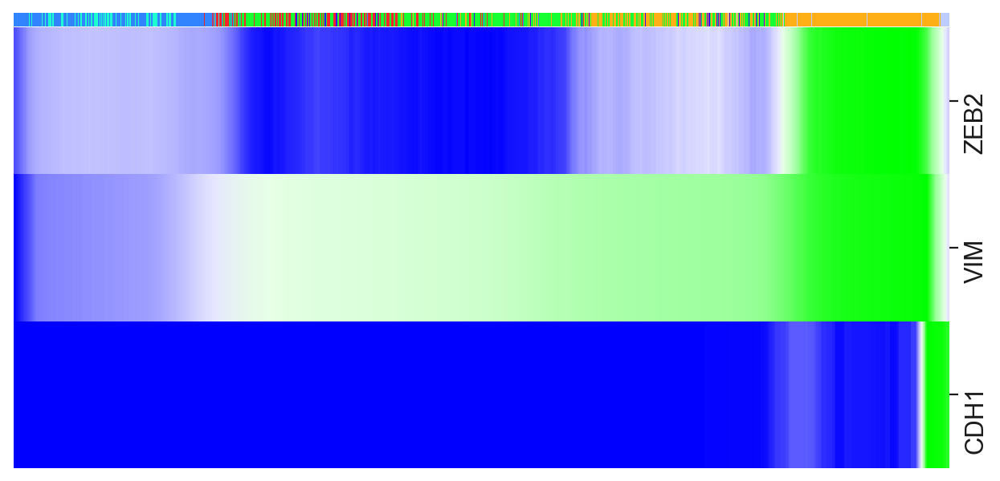

In [93]:
scv.pl.heatmap(adata_magic, var_names=emt_genes, sortby='vim_time', color_map=user_defined_cmap_degs, col_color='cell_type', n_convolve=100)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='DEA'></a>

## 6 Apply differential expression analysis (DEA)

We use the wilcoxon test here to perform differential expression analysis between our defined cell types. This can verify the identity of the annotated populations and also identify novel canonical marker genes. 

✍️ The test can be used for any type of comparison provided that you give it the right grouping factor.

### 6.1 Wilcoxon test

In [94]:
sc.tl.rank_genes_groups(adata, 'cell_type', method='wilcoxon', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


Create a pandas table showing the top 15 differentially expressed genes for each cell type. 

✍️ Change number in brackets to get a more extended gene list.

In [95]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(5)

,B_n,CD4 T_n,CD8 T_n,CD14+ Monocytes_n,DCs_n,FCGR3A+ Monocytes_n,NK cells_n
0,CD79A,LDHB,CCL5,S100A9,CST3,FCGR3A,GNLY
1,CD79B,EEF1A1,NKG7,S100A8,HLA-DRB1,LST1,NKG7
2,CD74,TRAC,GZMA,LYZ,HLA-DRB5,AIF1,KLRD1
3,CD37,CD3D,IL32,FOS,HLA-DPA1,COTL1,PRF1
4,MS4A1,CD3E,CTSW,S100A12,HLA-DPB1,SAT1,GZMA


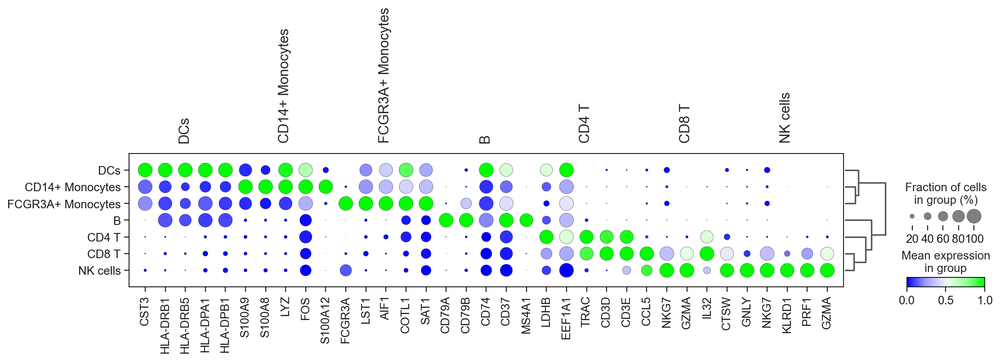

In [96]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, standard_scale='var', cmap=user_defined_cmap_degs)

Use pandas `ExcelWriter` function (https://pandas.pydata.org/docs/reference/api/pandas.ExcelWriter.html) to save the results to a file in the directory of your choice. Here, we name our file `shunPykeR_wilcox.xlsx` and the path leading to the directory is `../output/`.

💡 The `..` denotes a level up from the current directory.

In [97]:
writer = pd.ExcelWriter('../output/shunPykeR_wilcox.xlsx', engine='xlsxwriter')

for subset in ["B", "CD4 T", "CD8 T", "CD14+ Monocytes", "DCs", "FCGR3A+ Monocytes", "NK cells"]:   
    sc.tl.rank_genes_groups(adata, 'cell_type', groups=[subset], method='wilcoxon', use_raw=False)
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name=subset)
        
writer.save()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be i

Similar to scanpy's `sc.pl.dotplot` function, scanpy's `sc.pl.rank_genes_groups_dotplot` function plots a selection of top genes (specify in the `n_genes` field) from the last performed comparison. You can check the man page for this function here (https://scanpy.readthedocs.io/en/latest/generated/scanpy.pl.rank_genes_groups_dotplot.html#scanpy-pl-rank-genes-groups-dotplot).

### 6.2 Visualize the DEA results

💡 Sections initialized with the `%%R` line use R code instead of python. This is to take advantage of some further flexibility that may be available in certain scenarios when creating or plotting the analysis results.

Use the code below to read in the wilcoxon saved results from the shunPykeR_wilcox.xlsx file and store the appropriate fields in a long format.

In [98]:
%%R 

wilcox_results = excel_sheets('../output/shunPykeR_wilcox.xlsx')
wilcox_results_combined = NULL
for (item in wilcox_results) {
    wilcox_result <- read_excel('../output/shunPykeR_wilcox.xlsx', sheet = item)
    colnames(wilcox_result) <- c('index', 'name', 'score', 'log2_fc', 'p_adj')
    wilcox_result$p_adj[wilcox_result$p_adj == 0] <- min(wilcox_result$p_adj[wilcox_result$p_adj>0])
    wilcox_result$`-log10(p_adj)` = -log(wilcox_result$p_adj, 10)
    wilcox_result$subset = item
    wilcox_result_sorted = wilcox_result[order(wilcox_result$score, decreasing = TRUE),]
    wilcox_result_sorted = wilcox_result_sorted[wilcox_result_sorted$p_adj<=0.05,]
    wilcox_results_combined = bind_rows(wilcox_results_combined, wilcox_result_sorted) # select # of top genes per subset 
}

New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`


Use R's `ggdotchart` function from the ggpubr package (https://rpkgs.datanovia.com/ggpubr/reference/ggdotchart.html) to plot a selection of genes that are differentially expressed in at lease one of our comparisons. 

✍️ Change the list of genes inside the `c()` function to your preferred ones.

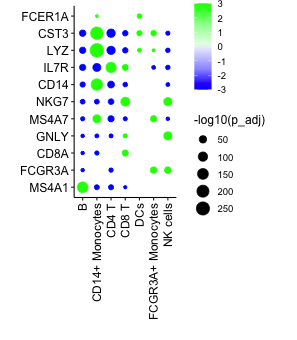

In [99]:
%%R -w 10.5 -h 12 -u cm
tt = wilcox_results_combined[wilcox_results_combined$name %in% c('MS4A1', 'CD14', 'LYZ', 'MS4A7', 'FCGR3A','CST3', 'FCER1A', 'IL7R', 'CD8A',  'NKG7', 'GNLY'),]
tt$squished_Zscore = squish(tt$score, range=c(-3, 3), only.finite=TRUE)

print(ggdotchart(tt, x='name', y='subset', group = 'subset',rotate=TRUE, color='squished_Zscore', size = '-log10(p_adj)', sorting='none', xlab = "",  ylab = "") +
scale_color_gradientn(colours = dichromat::colorschemes$BluetoGreen.14) +  
theme_pubr() + theme(legend.position='right', axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)))


### 6.3 From DEA to pathway and network enrichment analysis

#### 6.3.1 Convert wilcox DEA results to GSEA ranks 

The block of R code below takes the `shunPykeR_wilcox.xlsx` as input and converts each comparison into a ranked file format for input into the GSEA's PreRanked analysis module (see here http://www.gsea-msigdb.org/gsea/doc/GSEAUserGuideFrame.html for more details).

In [100]:
%%R 

# read in all available excel sheet names 
wilcox_results = excel_sheets('../output/shunPykeR_wilcox.xlsx')

rnk_items_list = NULL

for (item in wilcox_results) {
      wilcox_result <- read_excel('../output/shunPykeR_wilcox.xlsx', sheet = item)
      rnk_item = na.omit(wilcox_result[,c(2,3)])
      rnk_item_sorted = rnk_item[order(rnk_item[,2], decreasing = TRUE),]
      colnames(rnk_item_sorted)[1] = '#primerid' # comment out header
      colnames(rnk_item_sorted)[2] = '#rank_score' # comment out header
      write.table(rnk_item_sorted, file = paste0('../output/wilcox_result_', item, '.rnk'), sep='\t', row.names = FALSE, quote = FALSE)
}

New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`


#### 6.3.2 Run GSEA

This section is still under development. Please use the GSEA desktop interface (http://www.gsea-msigdb.org/gsea/downloads.jsp) with the generated .rnk files to run the pathway enrichment analysis.

#### 6.3.3 Run enrichmentMap in Cytoscape

Also under development. Please use the Enrichmentmap module via the Cytoscape interface (https://cytoscape.org/download.html) with the GSEA results to run the network enrichment analysis.

#### 6.3.4 Plot cytoscape networks as a summarised dotplot

The enrichmentMap panel in Cytoscape offers a beatiful way of looking at the pathways that share common gene set as networks. We offer here another alternative that can create a summarized dotplot using the enrichmentMap results table and the ggpubr's `ggdotchart` function in R. The only suggetion for this to work best to add a column in the enrichmentMap saved file (here we named it `group`) based on which the dotchart will group the pathways across comparisons. This helps when there are hundreds of resulting pathways, many of them having a redundant core gene set, to just subselect a few of them per grouping.

The block of R code below removes all unnecessary columns from the enrichmentMap table and converts it to a long format required for the `ggdotchart` function to work properly.

In [ ]:
%%R -w 22 -h 20 -u cm 

fromNetwork <- read_excel("../output/enrichmentMapCytoscape_annotated.xlsx", sheet="Sheet1")
fromNetwork_clean <- select(fromNetwork, -contains(c("::Dataset_Chart", "::Genes", "::GS_DESCR", "::Name", "shared name", "selected", 
                                                     "::GS_Type", "Colouring", "::ES", "::fwer_qvalue", "::pvalue")))
#fromNetwork_clean = fromNetwork_clean  %>% group_by(Group) %>% slice_min(order_by = minFDR, n = 5)

forDotplot <- as_tibble(lapply(fromNetwork_clean[,c(16, 32, 33,34)], rep, ncol(select(fromNetwork_clean,starts_with("EnrichmentMap::fdr_qvalue")))))


tmpFDR = NULL
FDR=NULL
tmpNES = NULL
NES=NULL
tmp_subset = NULL
subset=NULL

# append (in order) all FDR columns and all NES columns
for (i in c(1:ncol(select(fromNetwork_clean ,starts_with("EnrichmentMap::fdr_qvalue"))))) {
  tmpFDR = select(fromNetwork_clean,starts_with("EnrichmentMap::fdr_qvalue"))[i]
  colnames(tmpFDR) = "FDR"
  FDR = rbind(FDR, tmpFDR)
}

for (i in c(1:ncol(select(fromNetwork_clean,starts_with("EnrichmentMap::NES"))))) {
  tmpNES = select(fromNetwork_clean,starts_with("EnrichmentMap::NES"))[i]
  colnames(tmpNES) = "NES"
  NES = rbind(NES, tmpNES) 
}

forDotplot$NES = NES$NES
forDotplot$FDR = FDR$FDR

forDotplot$subset = rep(str_replace(colnames(select(fromNetwork_clean,starts_with("EnrichmentMap::NES"))), "EnrichmentMap::NES ", ""), each=nrow(fromNetwork_clean))
colnames(forDotplot) <- c("gs_size", "name", "group", "minFDR", "NES", "FDR", "subset")
forDotplot$FDR[forDotplot$FDR>0.05] <- NA
forDotplot$FDRtr = -log(forDotplot$FDR+0.00001,10)

print(ggdotchart(forDotplot,  x='name', y='subset', group = 'group',  size='FDRtr', rotate=TRUE, color = 'NES', xlab = "", ylab = "", sorting = "none") +
  scale_colour_gradientn(colours = dichromat::colorschemes$BluetoGreen.14) +
  theme_pubclean() + theme(axis.text.x = element_text(face ="bold", angle = 90), axis.text.y = element_text(size =6)) +
  theme(legend.position = "right", panel.background = element_rect(colour = "black",size = 1, linetype = "solid"))) #+ 

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='scOMICs'></a>

## 7 Integration with other types of scOMICs data

Oftentimes, scRNA-seq data need to be integrated with other formats of OMICs data. Here we explore some of these options.

### 7.1 RNA velocity with loom data

The code below can be used to combine loom files generated for your specific samples with the already processed adata object to run standard RNA velocity analysis. Code has been adapted from https://linnarssonlab.org/loompy/fullapi/new.html and the scvelo website and tested with private data, since loom files for these public datasets were unavailable. For more details and alternative ways of analysis, please explore https://scvelo.readthedocs.io/en/stable/.

In [ ]:
ds_list = [] # initiate empty dataset list

loom_path = ['PBMC-v2.loom', 'PBMC-v3.loom'] # provide path to loom files 

with loompy.new('loom_merged.loom') as dsout:  # create a new, empty, loom file
    for f in loom_path:
        with loompy.connect(f) as ds:
            totals = ds.map([np.sum], axis=1)[0]
            cells = np.where(totals > 0)[0] 
            ds_list.append(ds.shape[1])
            for (ix, selection, view) in ds.scan(items=cells, axis=1):
                dsout.add_columns(view.layers, col_attrs=view.ca, row_attrs=view.ra)

In [ ]:
ldata = scv.read('loom_merged.loom') # read newly created merged loom file

✍️ Here we will make sure that the barcodes of the cells are identical to the annotation in our adata object that we created above.

In [ ]:
x = np.repeat(np.array([ '@PBMC-v2', '@PBMC-v3']), ds_list, axis=0) 
ldata.obs['name_match'] = x
start = ':'
end = 'x'

barcodes = []
for loom_index in ldata.obs_names:
    barcodes.append(str(loom_index[loom_index.find(start)+len(start):loom_index.rfind(end)]))
ldata.obs['barcodes'] = barcodes
ldata.obs_names = ldata.obs[['barcodes','name_match']].agg(''.join, axis=1)

❗Run the next line to check if all of your loom cell entries have been properly mapped to the entries of your adata object. If result is an empty list, you are good to go.

In [ ]:
from collections import Counter
[k for k, v in Counter(ldata.obs_names).items() if v > 1]

Merge data, perform RNA velocity analysis and plot resulting UMAP with velocity arrows. Check https://scvelo.readthedocs.io/en/stable/VelocityBasics/ for results interpretation and processing alternatives.

In [ ]:
adata_loom = scv.utils.merge(adata, ldata)

In [ ]:
scv.tl.velocity(adata_loom, mode='stochastic')

In [ ]:
scv.tl.velocity_graph(adata_loom)

In [ ]:
scv.pl.velocity_embedding_stream(adata_loom, basis='umap', color=['cell_type'],alpha=0.7, legend_loc='right')

### 7.2 Spatial localization with visium data

The code below can be used to integrate your visium files with the already processed anndata object using scanorama (https://github.com/brianhie/scanorama).

✍️ Add path to your `filtered_feature_bc_matrix.h5` file generated with velocyto. 

In [ ]:
path = '../output/'
visium = sc.read_visium(path=path, count_file="filtered_feature_bc_matrix.h5", source_image_path=path)
visium.var_names_make_unique()

This next block of code is a squeezed version of all code presented in `chapter 1` (excluding the doublets identification and removal step that is not applicable here) to clean up the visium datasets one-by-one using the quality metrics and the H&E slide of each sample as a guide. 

✍️ If any clusters need to be removed, you can add them here `clusters_to_remove = []`. Make sure that the next line `cluster_filter = [x not in clusters_to_remove for x in visium.obs['leiden_1.0']]` has the right leiden clustering resolution based on which you are trying to remove clusters.

In [ ]:
visium.raw = visium
np.random.seed(42) 
index_list = np.arange(visium.shape[0])
np.random.shuffle(index_list)
visium = visium[index_list]

sc.pp.calculate_qc_metrics(visium, inplace=True)
visium.obs['original_total_counts'] = visium.obs['total_counts']
visium.obs['log10_original_total_counts'] = np.log10(visium.obs['original_total_counts'])
visium.var['mt'] = visium.var_names.str.startswith(('MT-', 'mt-'))
visium.var['ribo'] = visium.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))  
visium.var['hb'] = visium.var_names.str.startswith(('^Hb', '^HB')) # hemoglobin genes
visium.obs['mito_frac'] = np.sum(visium[:,visium.var['mt']==True].X, axis=1) / np.sum(visium.X, axis=1)
visium.obs['ribo_frac'] = np.sum(visium[:,visium.var['ribo']==True].X, axis=1) / np.sum(visium.X, axis=1)
visium.obs['hb_frac'] = np.sum(visium[:,visium.var['hb']==True].X, axis=1) / np.sum(visium.X, axis=1)

sc.pp.filter_genes(visium, min_cells=1)
visium = visium[:,visium.var['ribo']==False]
visium = visium[:,visium.var['hb']==False]
sc.pp.normalize_per_cell(visium, counts_per_cell_after=10**4)
sc.pp.log1p(visium)

sc.tl.pca(visium, n_comps=200, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=False)
observe_variance(visium)
sc.tl.pca(visium, n_comps=30,  svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=False)
sc.pp.neighbors(visium, n_neighbors=15, random_state=42)
sc.tl.umap(visium)
sc.pl.umap(visium, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette='tab20', color_map='Spectral_r', ncols=4, wspace = 0.5, sort_order = False)

for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(visium, resolution=resolution_parameter, random_state=42, 
                 key_added='leiden_'+str(resolution_parameter))

sc.pl.umap(visium, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette, color_map='Spectral_r', use_raw=False, ncols=5, wspace = 0.7,
    outline_width=[0.6, 0.05], frameon=False, add_outline=True, sort_order = False)

sc.pl.spatial(visium, 
    img_key="hires", color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    size=1.5, color_map='Spectral_r', ncols=4)

sc.pl.spatial(visium, img_key="hires", size=1.5, color_map='Spectral_r', ncols=4) 
sc.pl.spatial(visium, img_key="hires", color = ['leiden_1.0'], size=1.5, color_map='Spectral_r', ncols=4)
    
clusters_to_remove = []
cluster_filter = [x not in clusters_to_remove for x in visium.obs['leiden_1.0']]
print('Total number of cells pre-filtering: ' + str(visium.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
visium_filtered = visium[cluster_filter]
visium = visium_filtered
    
sc.pp.highly_variable_genes(visium, n_top_genes=5000, n_bins=20, flavor='seurat',  inplace=True)   
sc.tl.pca(visium, n_comps=200, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=True)
observe_variance(visium)

sc.tl.pca(visium, n_comps=30, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=True)
sc.pp.neighbors(visium, n_neighbors=15)
sc.tl.umap(visium)
sc.pl.umap(visium, color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette='tab20', color_map='Spectral_r', ncols=4,  wspace = 0.5, sort_order = False)
    
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(visium, resolution=resolution_parameter, random_state=42, 
                 key_added='leiden_'+str(resolution_parameter))    
        
sc.pl.umap(visium, color=['leiden_0.2'], color_map='Spectral_r', ncols=4, wspace = 0.5, sort_order = False)   
sc.pl.spatial(visium, img_key="hires", size=1.5, color_map='Spectral_r', ncols=4)
sc.pl.spatial(visium, img_key="hires", color = ['leiden_0.2'], color_map='Spectral_r', size=1.5, ncols=4)

The next sections have been adapted from scanpy's scanorama pipeline to perform the integration between the clean adata and visium samples. Explore what happens behind the scenes and explore more options here https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html.

In [ ]:
adatas = [adata, visium] 
scanorama.integrate_scanpy(adatas)
adatas[0].obsm['X_scanorama'].shape

In [ ]:
total = adata.concatenate(
    visium,
    batch_key="dataset",
    batch_categories=["10x_Chromium", "10x_Visium"],
    join="outer",
    uns_merge="first",
)

In [ ]:
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]
all_s = np.concatenate(scanorama_int)
total.obsm["scanorama_embedding"] = all_s

In [ ]:
distances = 1 - cosine_distances(
    total[total.obs.dataset == "10x_Chromium"].obsm[
        "scanorama_embedding"
    ],
    total[total.obs.dataset == "10x_Visium"].obsm[
        "scanorama_embedding"
    ],
)

In [ ]:
class_prob = label_transfer(distances, adata.obs.cell_type)

In [ ]:
cp_df = pd.DataFrame(class_prob, columns=np.sort(adata.obs.cell_type.unique()))
cp_df.index =  visium.obs.index

adata_transfer =  visium.copy()
adata_transfer.obs = pd.concat([ visium.obs, cp_df], axis=1)

In [ ]:
sc.pl.spatial(adata_transfer,
                  img_key="hires",
                  color = ['leiden_0.2'],
                  size=1.5,
                  use_raw=False,
                  color_map='Spectral_r', 
                  ncols=6,
                  vmax=1.2,
                  vmin=0.4
                 )

### 7.3 Cross-species integration with mousipy

This section provides a nifty little package called mousipy (https://github.com/stefanpeidli/mousipy), that facilitates integration of single cell human data with mouse data.

✍️ Add path to your a mouse dataset that you would like to integrate with your human adata object. Code here has once again been tested with private data.

In [ ]:
path_to_mouse_h5ad = '../output/metadata/anndata_objects/mouse.h5ad'
mouse_adata = sc.read_h5ad(path_to_mouse_h5ad)

humanized_mouse_adata = translate(mouse_adata)

In [ ]:
in_human = sc.concat(
    [original_human_adata, humanized_mouse_adata],
    join='inner', 
    label = 'dataset', 
    keys = ['human', 'humanized_mouse'], 
    index_unique = '@')

In [ ]:
sc.pp.highly_variable_genes(in_human, n_bins=20, flavor='seurat', inplace=True)
rng = np.random.RandomState(42)
sc.tl.pca(in_human, n_comps=200, svd_solver='arpack', random_state=rng)
observe_variance(in_human)
rng = np.random.RandomState(42)
sc.tl.pca(in_human, n_comps=60, svd_solver='arpack', random_state=rng)
sce.pp.harmony_integrate(in_human, 'dataset')
sc.pp.neighbors(in_human, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(in_human)
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(in_human, 
    color=['dataset'], color_map='Spectral_r', use_raw=False, ncols=4, outline_width=[0.6, 0.05], 
    na_color='white', size=15, frameon=False, wspace = 0.2, add_outline=True, sort_order = False)

Return to the beginning of this notebook <a href='#contents'>here</a>.

**Well done!** You have reached the end of the shunPykeR's guide. You are a true shunPykeR now!

<a id='systemlog'></a>

## System log

Date, time stamps, version numbers, and hardware information for version control.

In [103]:
%load_ext watermark

In [104]:
%watermark

Last updated: 2023-01-06T18:48:23.034947+00:00

Python implementation: CPython
Python version       : 3.8.13
IPython version      : 8.4.0

Compiler    : Clang 12.0.0 
OS          : Darwin
Release     : 20.6.0
Machine     : x86_64
Processor   : i386
CPU cores   : 8
Architecture: 64bit

